In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import make_interp_spline
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import folium
import geopandas as gpd
from folium import Choropleth
from folium import Popup
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Cho phép show toàn bộ nội dung trong 1 ô
pd.set_option('display.max_colwidth',None)
# Cho phép show tất cả các cột trong DF
pd.set_option('display.max_columns',None)

# 1. Load Data

In [2]:
diem_20_21= pd.read_csv('data_diemthi/diem_thi_2020_2021.csv')
diem_20_21.head()

,SBD,Tên,Ngày Sinh,Giới tính,Toán,Văn,Lý,Hoá,Sinh,Lịch Sử,Địa Lý,GDCD,Ngoại Ngữ,Year,code,province
0,18014547,NaN,NaN,NaN,6.4,6.75,NaN,NaN,NaN,4.75,7.00,6.50,4.2,2020,18,Bắc Giang
1,18014530,NaN,NaN,NaN,7.6,6.00,NaN,NaN,NaN,3.75,7.75,7.75,2.8,2020,18,Bắc Giang
2,18014521,NaN,NaN,NaN,4.8,4.75,NaN,NaN,NaN,4.00,6.50,NaN,NaN,2020,18,Bắc Giang
3,18014517,NaN,NaN,NaN,8.0,7.00,NaN,NaN,NaN,8.25,8.00,9.50,5.8,2020,18,Bắc Giang
4,18014523,NaN,NaN,NaN,8.2,6.50,8.0,8.5,5.0,NaN,NaN,NaN,4.0,2020,18,Bắc Giang


In [3]:
diem_22 = pd.read_csv('data_diemthi/diem_thi_thpt_2022.csv')
diem_22.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd
0,1000001,3.6,5.00,4.0,NaN,NaN,NaN,2.75,6.0,8.75
1,1000002,8.4,6.75,7.6,NaN,NaN,NaN,8.50,7.5,8.25
2,1000003,5.8,7.50,5.0,NaN,NaN,NaN,7.25,5.5,8.75
3,1000004,7.4,7.50,8.6,NaN,NaN,NaN,7.50,6.5,7.50
4,1000005,7.2,8.50,9.0,NaN,NaN,NaN,8.00,8.5,8.25


In [4]:
diem_23 = pd.read_csv('data_diemthi/diem_thi_thpt_2023.csv')
diem_23.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu
0,1000001,8.4,8.50,9.2,NaN,NaN,NaN,6.75,6.00,9.00,N1
1,1000002,7.2,8.50,9.2,NaN,NaN,NaN,8.75,6.50,8.50,N1
2,1000003,NaN,6.50,NaN,NaN,NaN,NaN,9.25,7.50,NaN,NaN
3,1000004,7.8,8.25,7.8,NaN,NaN,NaN,4.50,6.25,8.25,N1
4,1000005,7.2,8.00,7.8,NaN,NaN,NaN,4.75,6.75,8.25,N1


In [5]:
diem_24 = pd.read_csv('data_diemthi/diem_thi_thpt_2024.csv')
diem_24.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu
0,1000001,8.4,6.75,8.0,6.0,5.25,5.0,NaN,NaN,NaN,N1
1,1000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1
2,1000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1
3,1000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1
4,1000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1


# 2. Preprocessing

In [6]:
cities = {1:'Hà Nội',2:'TP. Hồ Chí Minh',3:'Hải Phòng',4:'Đà Nẵng',5:'Hà Giang',6:'Cao Bằng',7:'Lai Châu',8:'Lào Cai',
          9:'Tuyên Quang',10:'Lạng Sơn',11:'Bắc Kạn',12:'Thái Nguyên',13:'Yên Bái',14:'Sơn La',15:'Phú Thọ',16:'Vĩnh Phúc',
          17: 'Quảng Ninh',18:'Bắc Giang',19:'Bắc Ninh',21:'Hải Dương',22:'Hưng Yên',23:'Hòa Bình',24:'Hà Nam',25:'Nam Định',
          26:'Thái Bình',27:'Ninh Bình',28:'Thanh Hóa',29:'Nghệ An',30:'Hà Tĩnh',31:'Quảng Bình',32:'Quảng Trị',33:'Thừa Thiên Huế',
          34:'Quảng Nam',35:'Quảng Ngãi',36:'Kon Tum',37:'Bình Định',38:'Gia Lai',39:'Phú Yên',40:'Đăk Lăk',41:'Khánh Hòa',42:'Lâm Đồng',
          43:'Bình Phước',44:'Bình Dương',45:'Ninh Thuận',46:'Tây Ninh',47:'Bình Thuận',48:'Đồng Nai',49:'Long An',50:'Đồng Tháp',
          51:'An Giang',52:'Bà Rịa - Vũng Tàu',53:'Tiền Giang',54:'Kiên Giang',55:'Cần Thơ',56:'Bến Tre',57:'Vĩnh Long',58:'Trà Vinh',
          59:'Sóc Trăng',60:'Bạc Liêu',61:'Cà Mau',62:'Điện Biên',63:'Đăk Nông',64:'Hậu Giang'}

## Năm 20 - 21

In [7]:
diem_20_21.drop(columns=['Tên','Ngày Sinh','Giới tính','code'], inplace=True)
diem_20_21.head()

,SBD,Toán,Văn,Lý,Hoá,Sinh,Lịch Sử,Địa Lý,GDCD,Ngoại Ngữ,Year,province
0,18014547,6.4,6.75,NaN,NaN,NaN,4.75,7.00,6.50,4.2,2020,Bắc Giang
1,18014530,7.6,6.00,NaN,NaN,NaN,3.75,7.75,7.75,2.8,2020,Bắc Giang
2,18014521,4.8,4.75,NaN,NaN,NaN,4.00,6.50,NaN,NaN,2020,Bắc Giang
3,18014517,8.0,7.00,NaN,NaN,NaN,8.25,8.00,9.50,5.8,2020,Bắc Giang
4,18014523,8.2,6.50,8.0,8.5,5.0,NaN,NaN,NaN,4.0,2020,Bắc Giang


In [8]:
# Change column name in dataframe diem_20_21
diem_20_21.rename(columns={
    'SBD':'sbd',
    'Toán':'toan',
    'Văn':'ngu_van',
    'Lý':'vat_li',
    'Hoá':'hoa_hoc',
    'Sinh': 'sinh_hoc',
    'Lịch Sử': 'lich_su',
    'Địa Lý': 'dia_li',
    'GDCD': 'gdcd',
    'Ngoại Ngữ':'ngoai_ngu',
    'Year':'year'
},inplace=True)

In [9]:
diem_20_21 = diem_20_21[['sbd','toan','ngu_van','ngoai_ngu','vat_li','hoa_hoc','sinh_hoc','lich_su','dia_li','gdcd','year','province']]

## Năm 22 - 23 - 24

In [10]:
# Add 'year' column for year 22 23 24
diem_22['year'] = '2022'
diem_23['year'] = '2023'
diem_24['year'] = '2024'

### Năm 22

In [11]:
# Add zero to SBD but only 7 digits in length
diem_22['sbd'] = diem_22['sbd'].astype(str).apply(lambda x: x.zfill(8))

In [ ]:
# Create a Province column from the first 2 numbers of SBD
diem_22['province'] = diem_22['sbd'].str[:2].astype(int).map(cities)
diem_22.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,year,province
0,01000001,3.6,5.00,4.0,NaN,NaN,NaN,2.75,6.0,8.75,2022,Hà Nội
1,01000002,8.4,6.75,7.6,NaN,NaN,NaN,8.50,7.5,8.25,2022,Hà Nội
2,01000003,5.8,7.50,5.0,NaN,NaN,NaN,7.25,5.5,8.75,2022,Hà Nội
3,01000004,7.4,7.50,8.6,NaN,NaN,NaN,7.50,6.5,7.50,2022,Hà Nội
4,01000005,7.2,8.50,9.0,NaN,NaN,NaN,8.00,8.5,8.25,2022,Hà Nội


In [13]:
diem_22['ma_ngoai_ngu'] = 'none'

### Năm 23

In [14]:
#  Add zero to SBD but only 7 digits in length
diem_23['sbd'] = diem_23['sbd'].astype(str).apply(lambda x: x.zfill(8))

In [ ]:
# Create a Province column from the first 2 numbers of SBD
diem_23['province'] = diem_23['sbd'].str[:2].astype(int).map(cities)
diem_23.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,province
0,01000001,8.4,8.50,9.2,NaN,NaN,NaN,6.75,6.00,9.00,N1,2023,Hà Nội
1,01000002,7.2,8.50,9.2,NaN,NaN,NaN,8.75,6.50,8.50,N1,2023,Hà Nội
2,01000003,NaN,6.50,NaN,NaN,NaN,NaN,9.25,7.50,NaN,NaN,2023,Hà Nội
3,01000004,7.8,8.25,7.8,NaN,NaN,NaN,4.50,6.25,8.25,N1,2023,Hà Nội
4,01000005,7.2,8.00,7.8,NaN,NaN,NaN,4.75,6.75,8.25,N1,2023,Hà Nội


### Năm 24

In [16]:
# Add zero to SBD but only 7 digits in length
diem_24['sbd'] = diem_24['sbd'].astype(str).apply(lambda x: x.zfill(8))

In [ ]:
#  Create a Province column from the first 2 numbers of SBD
diem_24['province'] = diem_24['sbd'].str[:2].astype(int).map(cities)
diem_24.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,province
0,01000001,8.4,6.75,8.0,6.0,5.25,5.0,NaN,NaN,NaN,N1,2024,Hà Nội
1,01000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1,2024,Hà Nội
2,01000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1,2024,Hà Nội
3,01000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1,2024,Hà Nội
4,01000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1,2024,Hà Nội


## Concat all tables

In [18]:
df_diem = pd.concat([diem_20_21,diem_22,diem_23,diem_24],ignore_index=True)

In [59]:
df_diem

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,year,province,ma_ngoai_ngu
0,18014547,6.4,6.75,4.2,NaN,NaN,NaN,4.75,7.00,6.50,2020,Bắc Giang,NaN
1,18014530,7.6,6.00,2.8,NaN,NaN,NaN,3.75,7.75,7.75,2020,Bắc Giang,NaN
2,18014521,4.8,4.75,NaN,NaN,NaN,NaN,4.00,6.50,NaN,2020,Bắc Giang,NaN
3,18014517,8.0,7.00,5.8,NaN,NaN,NaN,8.25,8.00,9.50,2020,Bắc Giang,NaN
4,18014523,8.2,6.50,4.0,8.00,8.5,5.0,NaN,NaN,NaN,2020,Bắc Giang,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4936978,64007282,4.2,6.00,3.0,NaN,NaN,NaN,5.25,6.25,7.50,2024,Hậu Giang,N1
4936979,64007283,5.2,6.00,3.6,NaN,NaN,NaN,6.25,5.75,7.75,2024,Hậu Giang,N1
4936980,64007284,7.2,8.00,7.0,6.25,7.0,8.0,NaN,NaN,NaN,2024,Hậu Giang,N1
4936981,64007285,5.2,5.25,4.4,NaN,NaN,NaN,4.75,6.50,8.75,2024,Hậu Giang,N1


In [110]:
df_diem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4936983 entries, 0 to 4936982
Data columns (total 13 columns):
 #   Column        Dtype  
---  ------        -----  
 0   sbd           object 
 1   toan          float64
 2   ngu_van       float64
 3   ngoai_ngu     float64
 4   vat_li        float64
 5   hoa_hoc       float64
 6   sinh_hoc      float64
 7   lich_su       float64
 8   dia_li        float64
 9   gdcd          float64
 10  year          object 
 11  province      object 
 12  ma_ngoai_ngu  object 
dtypes: float64(9), object(4)
memory usage: 489.7+ MB


In [68]:
for mon in df_diem.columns:
    if mon == 'sbd':
        continue
    print(df_diem[mon].isnull().value_counts())
    print()

toan
False    4875444
True       61539
Name: count, dtype: int64

ngu_van
False    4870458
True       66525
Name: count, dtype: int64

ngoai_ngu
False    4304415
True      632568
Name: count, dtype: int64

vat_li
True     3300345
False    1636638
Name: count, dtype: int64

hoa_hoc
True     3292794
False    1644189
Name: count, dtype: int64

sinh_hoc
True     3316164
False    1620819
Name: count, dtype: int64

lich_su
False    3252369
True     1684614
Name: count, dtype: int64

dia_li
False    3227958
True     1709025
Name: count, dtype: int64

gdcd
False    2718405
True     2218578
Name: count, dtype: int64

year
False    4936983
Name: count, dtype: int64

province
False    4936983
Name: count, dtype: int64

ma_ngoai_ngu
False    2789143
True     2147840
Name: count, dtype: int64



# 3. Visualization

## All subjects

In [31]:
# Number of students over the year
student_per_year = df_diem['year'].astype(str).value_counts().sort_index().to_frame()

# The growth rate of students over the year
student_growth_rate = student_per_year.pct_change() * 100

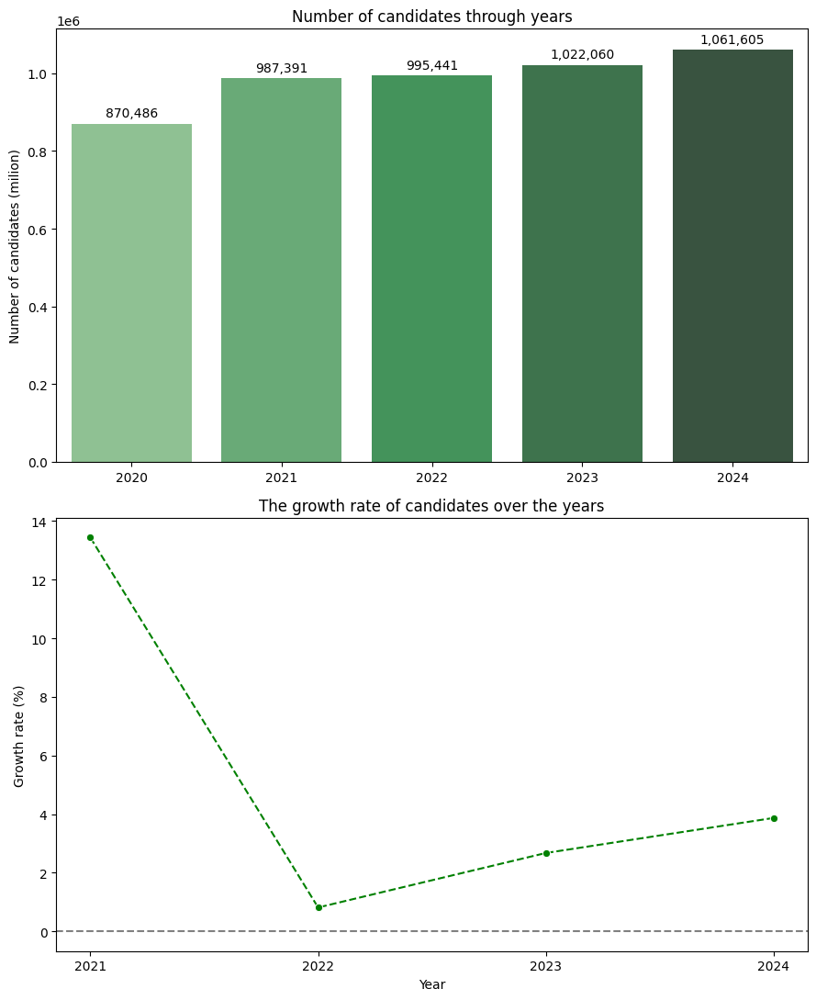

In [32]:
# Create 2 subplots (2 rows, 1 column)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 11))

# --- Row 1: Bar chart
sns.barplot(x='year', y='count', data=student_per_year, ax=ax1, palette='Greens_d')
ax1.set_title('Number of candidates through years')
ax1.set_ylabel('Number of candidates (milion)')
ax1.set_xlabel('')

# Add real data to the top of each bar bar
for container in ax1.containers:
    ax1.bar_label(container, labels=[f'{int(v):,}' for v in container.datavalues], padding=3)

# --- Row 2: Line chart
sns.lineplot(x='year', y='count', data=student_growth_rate,marker='o' ,linestyle='--',ax=ax2, color='green')
ax2.axhline(0, color='gray', linestyle='--')
ax2.set_title('The growth rate of candidates over the years')
ax2.set_ylabel('Growth rate (%)')
ax2.set_xlabel('Year')

# Layout alignment
plt.tight_layout()
plt.show()

In [79]:
df_diem['year'] = pd.to_numeric(df_diem['year'])

In [80]:
subjects = ['toan','ngu_van','ngoai_ngu','vat_li','hoa_hoc','sinh_hoc','lich_su','dia_li']

In [81]:
mean_score_by_year = df_diem.groupby('year')[subjects].mean().reset_index()
mean_score_by_year

,year,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li
0,2020,6.662271,6.601825,4.568337,6.718001,6.705225,5.588041,5.181097,6.773215
1,2021,6.613891,6.470180,5.851750,6.564922,6.629369,5.518109,4.972566,6.956714
2,2022,6.466254,6.507746,5.157686,6.723779,6.703898,5.019109,6.343930,6.677929
3,2023,6.250557,6.858194,5.462410,6.573900,6.744646,6.394933,6.025629,6.147523
4,2024,6.447309,7.231146,5.521938,6.666866,6.680830,6.284079,6.570343,7.193541


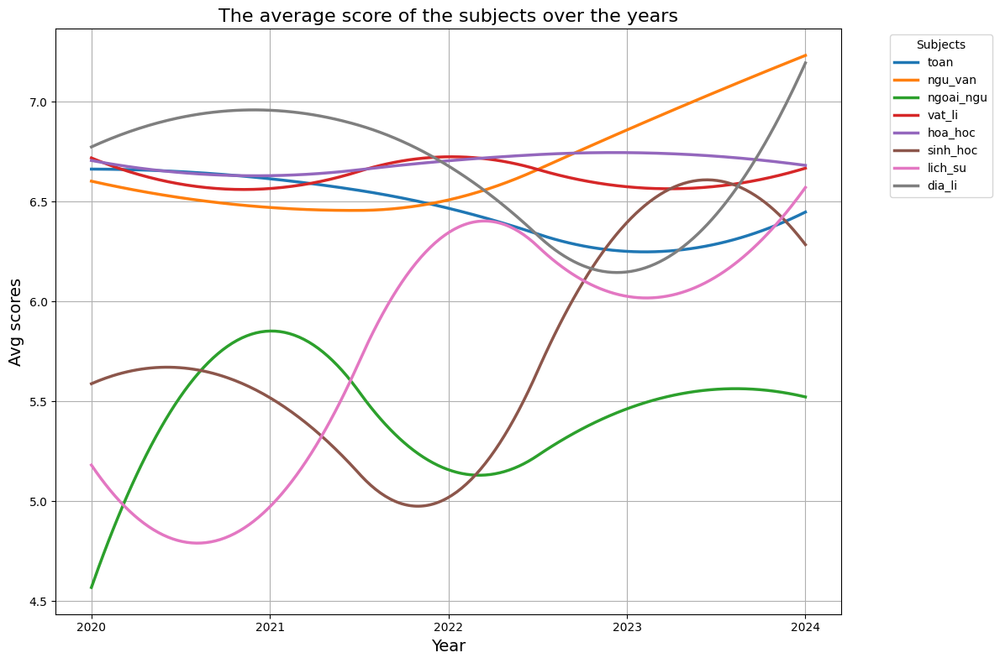

In [82]:
plt.figure(figsize=(12, 8))

for subject in subjects:
    x = mean_score_by_year['year']
    y = mean_score_by_year[subject]

    # Nội suy spline cho đường mượt
    x_new = np.linspace(x.min(), x.max(), 300)  # 300 điểm mịn
    spline = make_interp_spline(x, y, k=2)      
    y_new = spline(x_new)

    # Line
    plt.plot(x_new, y_new, label=subject,linewidth = 2.5,alpha = 1)


plt.title('The average score of the subjects over the years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Avg scores', fontsize=14)
plt.xticks([2020,2021,2022,2023,2024])
plt.legend(title='Subjects', bbox_to_anchor=(1.2, 1), loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

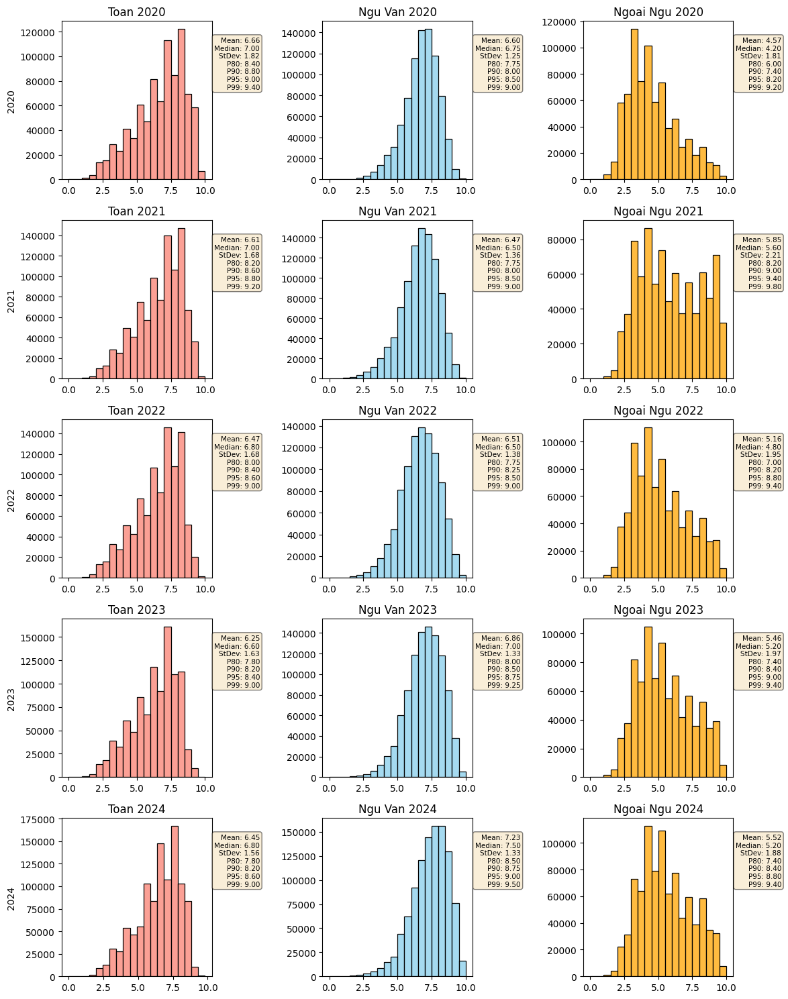

In [433]:
subjects = ['toan', 'ngu_van', 'ngoai_ngu'] 
years = sorted(df_diem['year'].unique())

# Màu cho từng môn
colors = {
    'toan': 'salmon',
    'ngu_van': 'skyblue',
    'ngoai_ngu': 'orange',
}

fig, axes = plt.subplots(
    nrows=len(years), 
    ncols=len(subjects), 
    figsize=(len(subjects)*4, len(years)*3), 
    sharex=False, 
    sharey=False
)
axes = np.array(axes)

# Vẽ từng ô
for i, year in enumerate(years):
    for j, subj in enumerate(subjects):
        ax = axes[i, j]

        # Data cho môn và năm hiện tại
        data = df_diem[df_diem['year'] == year][subj].dropna()

        sns.histplot(
            data=data,
            kde=False,
            bins=20,
            color=colors.get(subj),
            ax=ax
        )

        # Tiêu đề mỗi ô
        ax.set_title(f'{subj.replace("_", " ").title()} {year}', fontsize=12)

        # set ylabel ở cột đầu
        if j == 0:
            ax.set_ylabel(f'{year}', fontsize=10)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')

        # Tính toán các chỉ số
        mean = data.mean()
        median = data.median()
        std = data.std()
        p80 = data.quantile(0.8)
        p90 = data.quantile(0.9)
        p95 = data.quantile(0.95)
        p99 = data.quantile(0.99)

        # Viết text vào subplot
        textstr = (
            f'Mean: {mean:.2f}\n'
            f'Median: {median:.2f}\n'
            f'StDev: {std:.2f}\n'
            f'P80: {p80:.2f}\n'
            f'P90: {p90:.2f}\n'
            f'P95: {p95:.2f}\n'
            f'P99: {p99:.2f}'
        )
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(1.32, 0.9, textstr, transform=ax.transAxes, fontsize=7.5,
                verticalalignment='top', horizontalalignment='right', bbox=props)

plt.tight_layout()
plt.show()


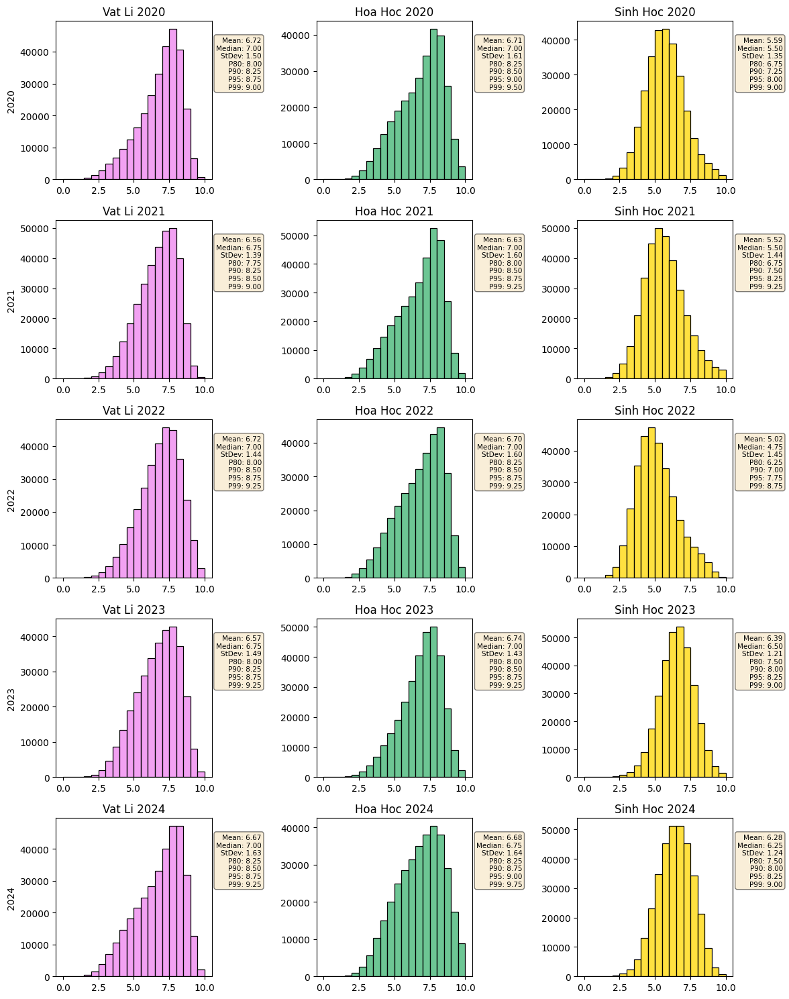

In [434]:
subjects = ['vat_li','hoa_hoc', 'sinh_hoc'] 
years = sorted(df_diem['year'].unique())

# Màu cho từng môn
colors = {
    'vat_li': 'violet',
    'hoa_hoc': 'mediumseagreen',
    'sinh_hoc': 'gold',
}

fig, axes = plt.subplots(
    nrows=len(years), 
    ncols=len(subjects), 
    figsize=(len(subjects)*4, len(years)*3), 
    sharex=False, 
    sharey=False
)
axes = np.array(axes)

# Vẽ từng ô
for i, year in enumerate(years):
    for j, subj in enumerate(subjects):
        ax = axes[i, j]

        # Data cho môn và năm hiện tại
        data = df_diem[df_diem['year'] == year][subj].dropna()

        sns.histplot(
            data=data,
            kde=False,
            bins=20,
            color=colors.get(subj),
            ax=ax
        )

        # Tiêu đề mỗi ô
        ax.set_title(f'{subj.replace("_", " ").title()} {year}', fontsize=12)

        # set ylabel ở cột đầu
        if j == 0:
            ax.set_ylabel(f'{year}', fontsize=10)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')

        # Tính toán các chỉ số
        mean = data.mean()
        median = data.median()
        std = data.std()
        p80 = data.quantile(0.8)
        p90 = data.quantile(0.9)
        p95 = data.quantile(0.95)
        p99 = data.quantile(0.99)

        # Viết text vào subplot
        textstr = (
            f'Mean: {mean:.2f}\n'
            f'Median: {median:.2f}\n'
            f'StDev: {std:.2f}\n'
            f'P80: {p80:.2f}\n'
            f'P90: {p90:.2f}\n'
            f'P95: {p95:.2f}\n'
            f'P99: {p99:.2f}'
        )
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(1.32, 0.9, textstr, transform=ax.transAxes, fontsize=7.5,
                verticalalignment='top', horizontalalignment='right', bbox=props)

plt.tight_layout()
plt.show()


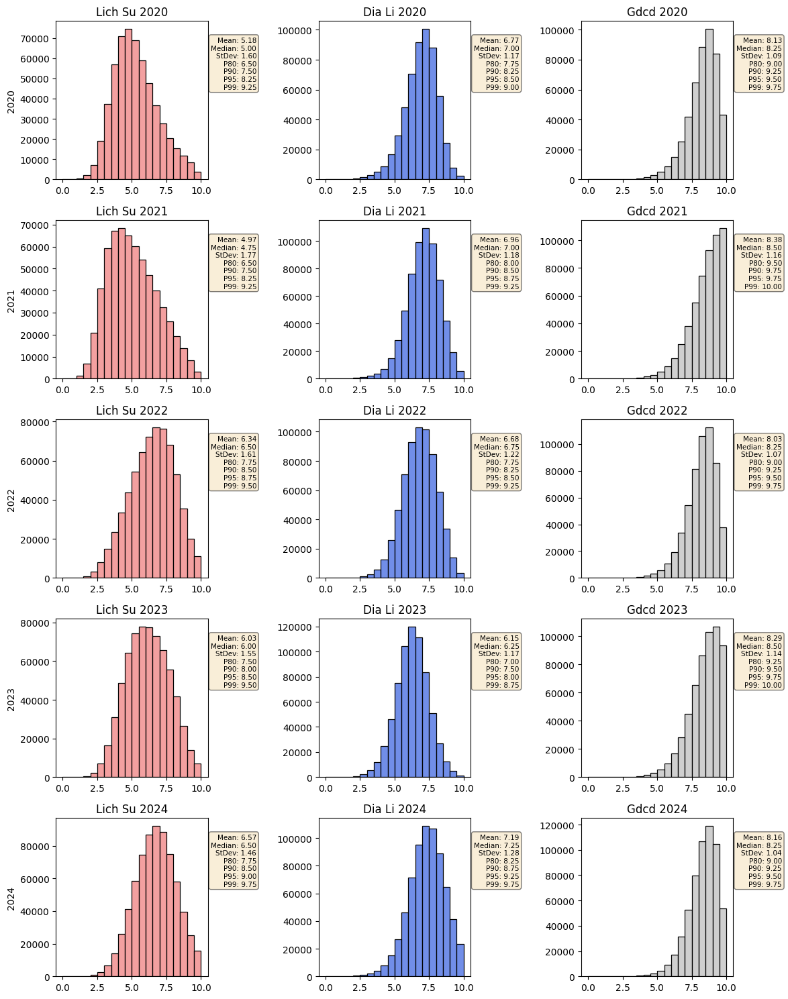

In [435]:
subjects =  ['lich_su', 'dia_li','gdcd'] 
years = sorted(df_diem['year'].unique())

# Màu cho từng môn
colors = {
    'lich_su': 'lightcoral',
    'dia_li': 'royalblue',
    'gdcd':'silver'
}
fig, ax

fig, axes = plt.subplots(
    nrows=len(years), 
    ncols=len(subjects), 
    figsize=(len(subjects)*4, len(years)*3), 
    sharex=False, 
    sharey=False
)
axes = np.array(axes)

# Vẽ từng ô
for i, year in enumerate(years):
    for j, subj in enumerate(subjects):
        ax = axes[i, j]

        # Data cho môn và năm hiện tại
        data = df_diem[df_diem['year'] == year][subj].dropna()

        sns.histplot(
            data=data,
            kde=False,
            bins=20,
            color=colors.get(subj),
            ax=ax
        )

        # Tiêu đề mỗi ô
        ax.set_title(f'{subj.replace("_", " ").title()} {year}', fontsize=12)

        # Chỉ set ylabel ở cột đầu
        if j == 0:
            ax.set_ylabel(f'{year}', fontsize=10)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')

        # Tính toán các chỉ số
        mean = data.mean()
        median = data.median()
        std = data.std()
        p80 = data.quantile(0.8)
        p90 = data.quantile(0.9)
        p95 = data.quantile(0.95)
        p99 = data.quantile(0.99)

        # Viết text vào subplot
        textstr = (
            f'Mean: {mean:.2f}\n'
            f'Median: {median:.2f}\n'
            f'StDev: {std:.2f}\n'
            f'P80: {p80:.2f}\n'
            f'P90: {p90:.2f}\n'
            f'P95: {p95:.2f}\n'
            f'P99: {p99:.2f}'
        )
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(1.32, 0.9, textstr, transform=ax.transAxes, fontsize=7.5,
                verticalalignment='top', horizontalalignment='right', bbox=props)


plt.tight_layout()
plt.show()


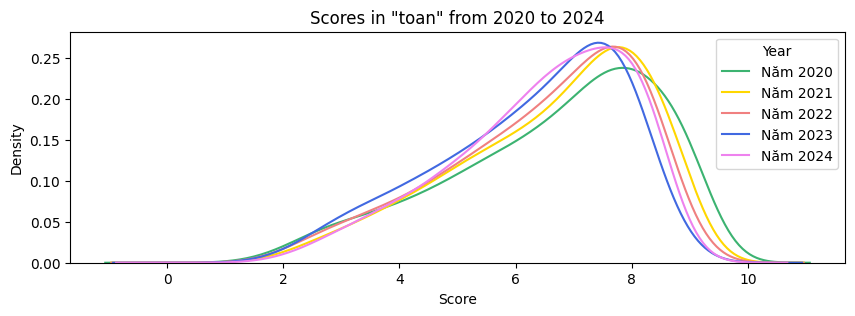

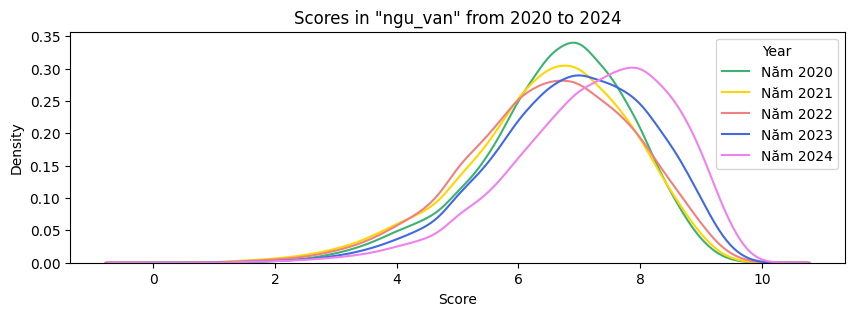

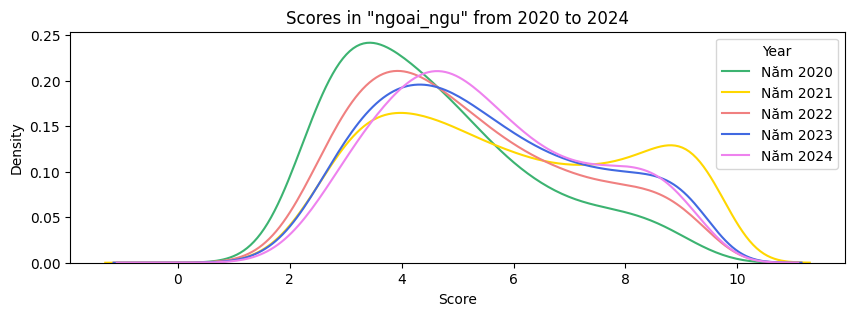

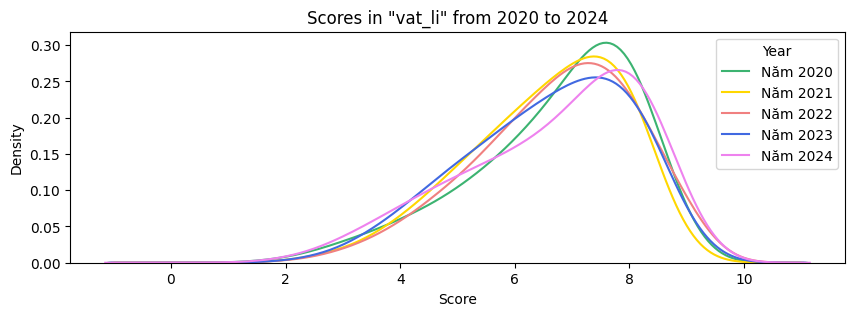

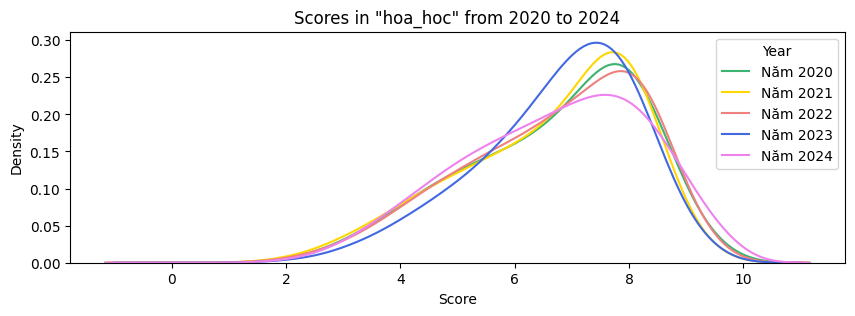

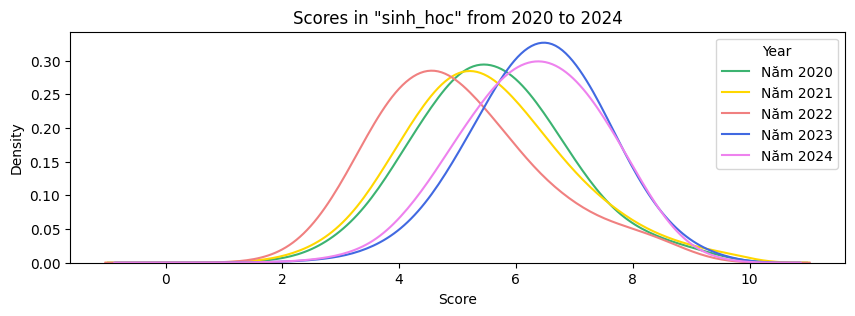

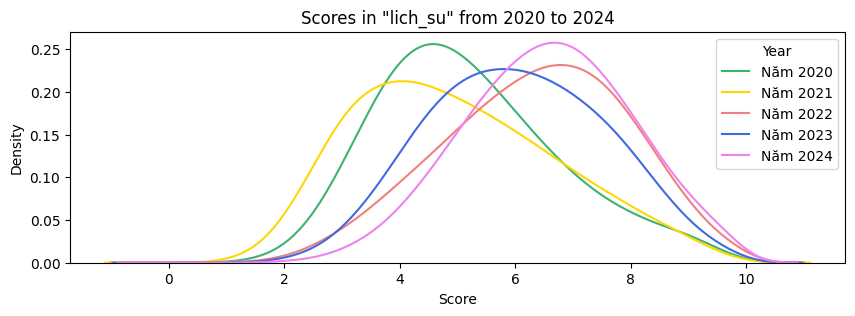

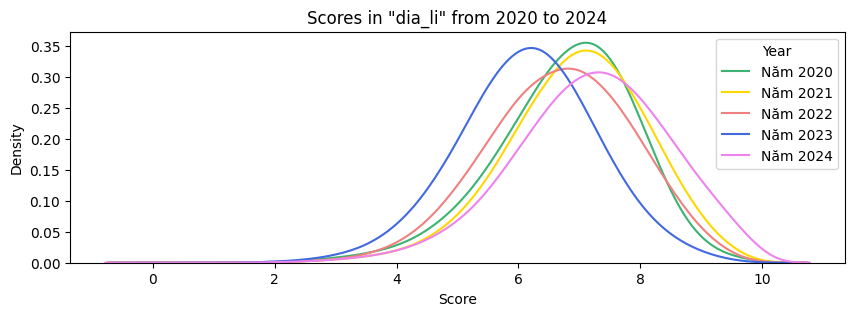

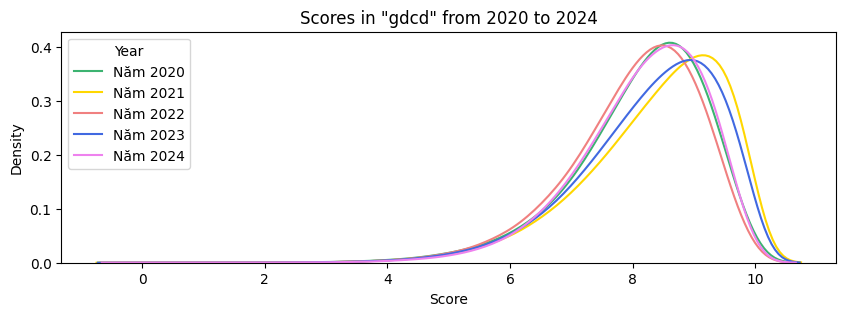

In [86]:
subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li','gdcd']
colors = ['mediumseagreen', 'gold', 'lightcoral', 'royalblue', 'violet']

for subject in subjects:
    plt.figure(figsize=(10, 3))
    
    # kdeplot
    for year, color in zip([2020, 2021, 2022, 2023, 2024], colors):
        data = df_diem[df_diem['year'] == year][subject].dropna()  
        sns.kdeplot(data, color=color, label=f'Năm {year}',bw_adjust=3)
    

    plt.title(f'Scores in "{subject}" from 2020 to 2024')
    plt.xlabel('Score')
    plt.ylabel('Density')
    plt.legend(title='Year')
    plt.show()


## Group analysis (Phân tích theo Khối)

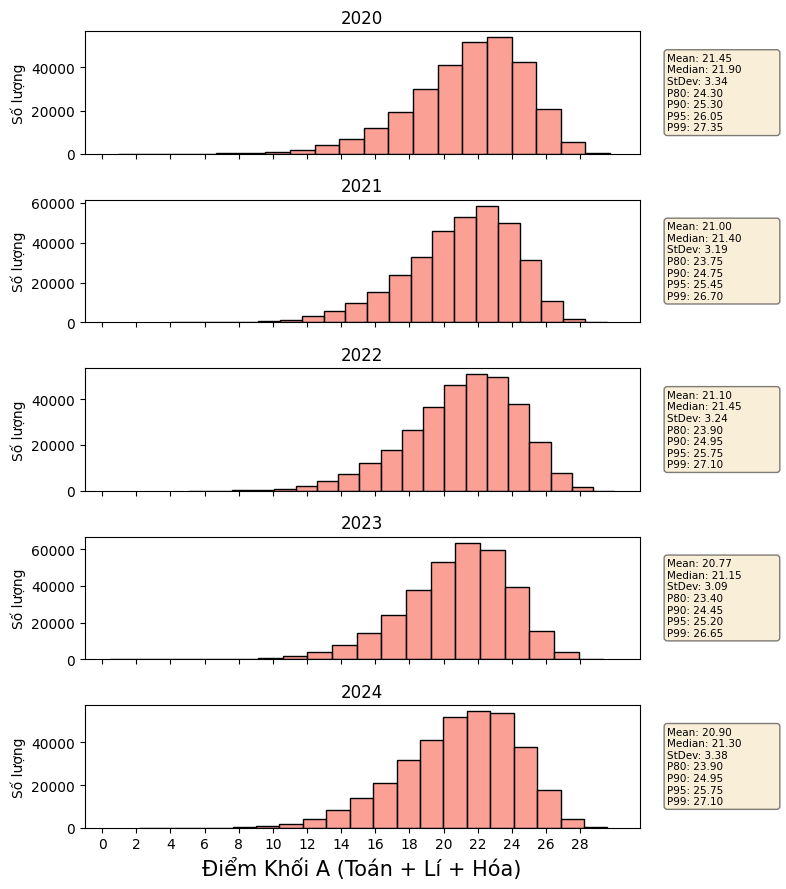

In [280]:
df_diem['A'] = df_diem['toan'] + df_diem['vat_li'] + df_diem['hoa_hoc']
df_diem['B'] = df_diem['toan'] + df_diem['hoa_hoc'] + df_diem['sinh_hoc']
df_diem['C'] = df_diem['ngu_van'] + df_diem['lich_su'] + df_diem['dia_li']
df_diem['D'] = df_diem['toan'] + df_diem['ngoai_ngu'] + df_diem['ngu_van']


fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['A'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='salmon')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối A (Toán + Lí + Hóa)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['A'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()



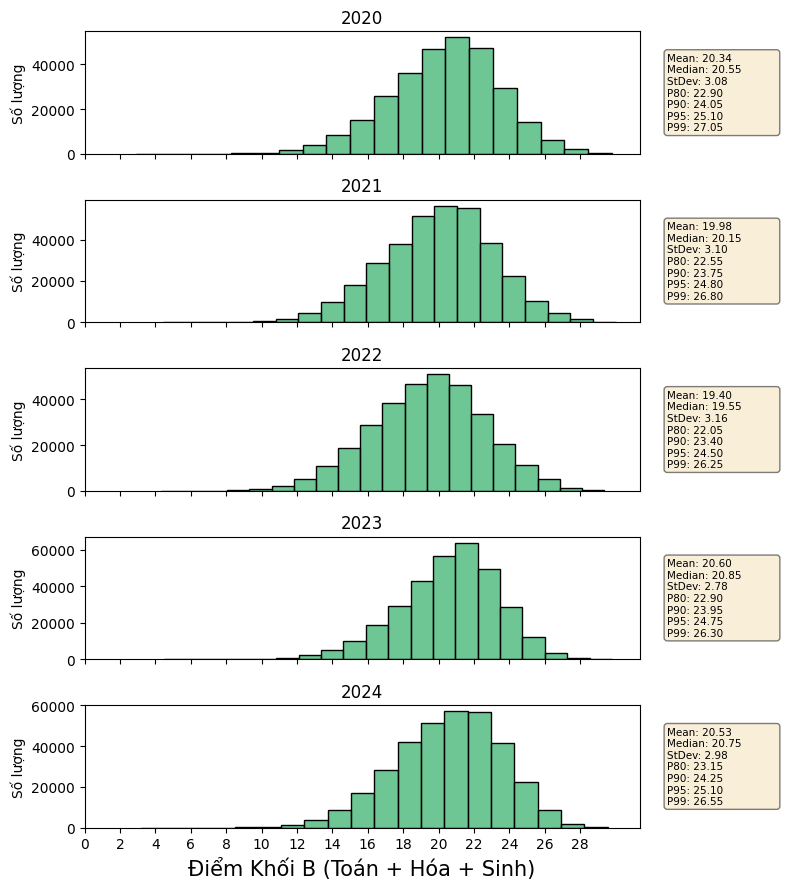

In [281]:
fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['B'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='mediumseagreen')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối B (Toán + Hóa + Sinh)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['B'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()

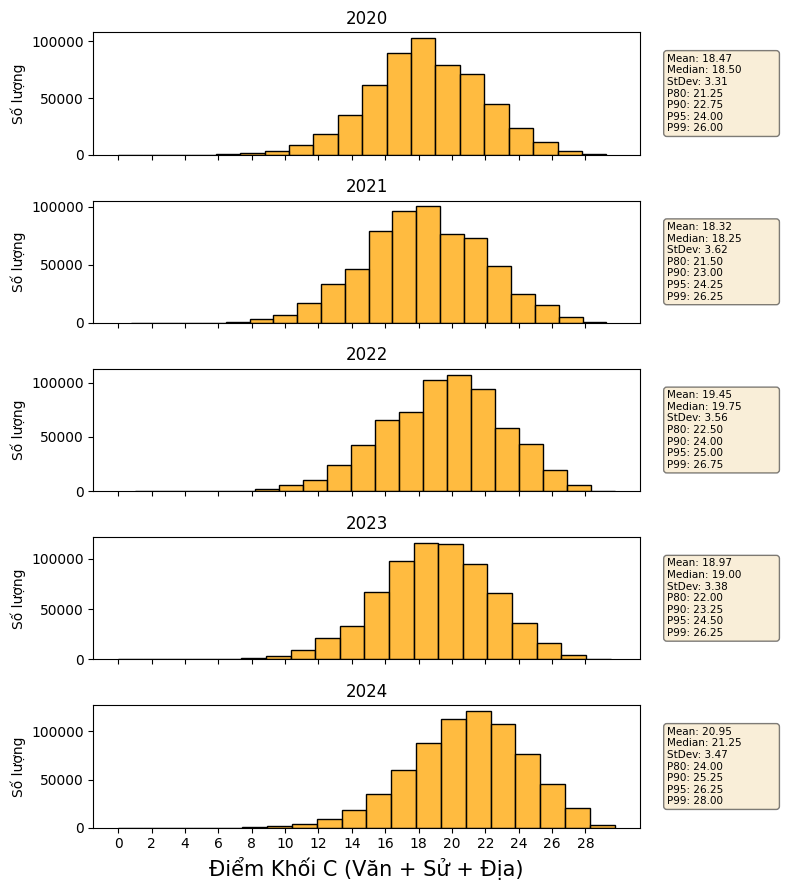

In [283]:
fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['C'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='orange')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối C (Văn + Sử + Địa)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['C'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()

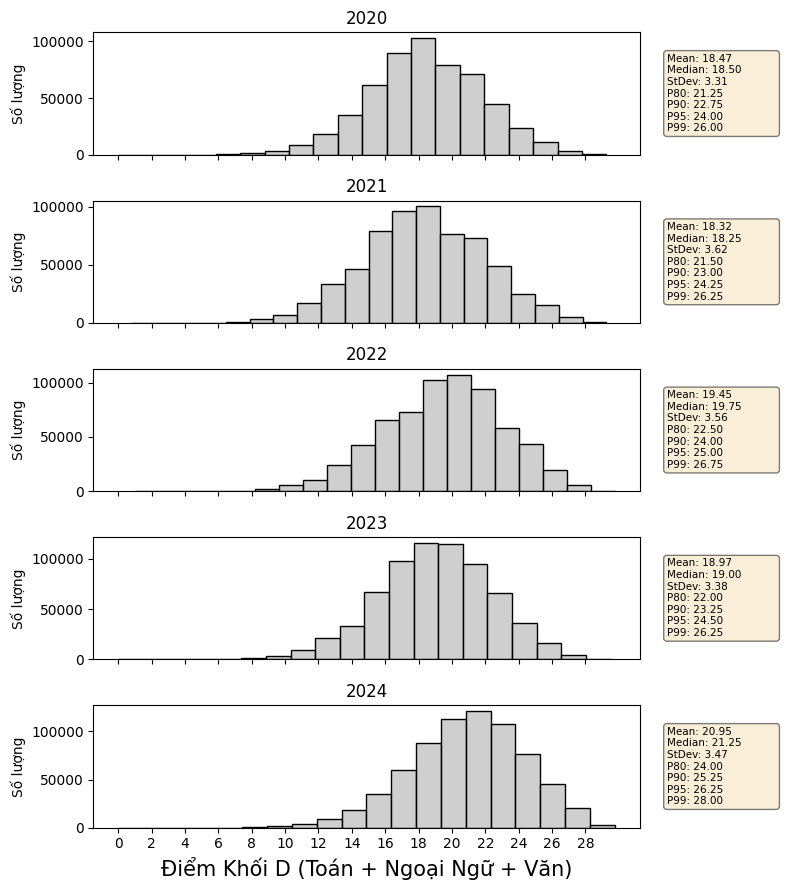

In [284]:
fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['C'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='silver')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối D (Toán + Ngoại Ngữ + Văn)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['C'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()

In [60]:
df_filtered = df_diem[df_diem['ma_ngoai_ngu'] != 'none']

# Nhóm dữ liệu và đếm số lượng
lang_counts = df_filtered.groupby(['year', 'ma_ngoai_ngu']).size().reset_index(name='count')

# barplot Plotly
fig = px.bar(
    lang_counts,
    x='year',
    y='count',
    color='ma_ngoai_ngu',
    text='count',  # Hiển thị số lượng trên cột
    barmode='group',  
    color_discrete_sequence=px.colors.qualitative.Set3  
)

# Makeup
fig.update_layout(
    title='Number of Foreign language code through 2023 - 2024',
    xaxis_title='Year',
    yaxis_title='Number',
    legend_title='Code',
    bargap=0.2,
    plot_bgcolor='white',
    width=1250,  # Thu hẹp chiều ngang lại
    height=600,
    xaxis=dict(
        showline=True,   # Vẽ line trục X
        linewidth=1,     # Độ dày line
        linecolor='black'  # Màu line
    ),
    yaxis=dict(
        showline=True,   # Vẽ line trục Y
        linewidth=1,
        linecolor='black'
    )
)

fig.show()


=> Hihgest: N1 (English), second highest: N4 (Chinese)

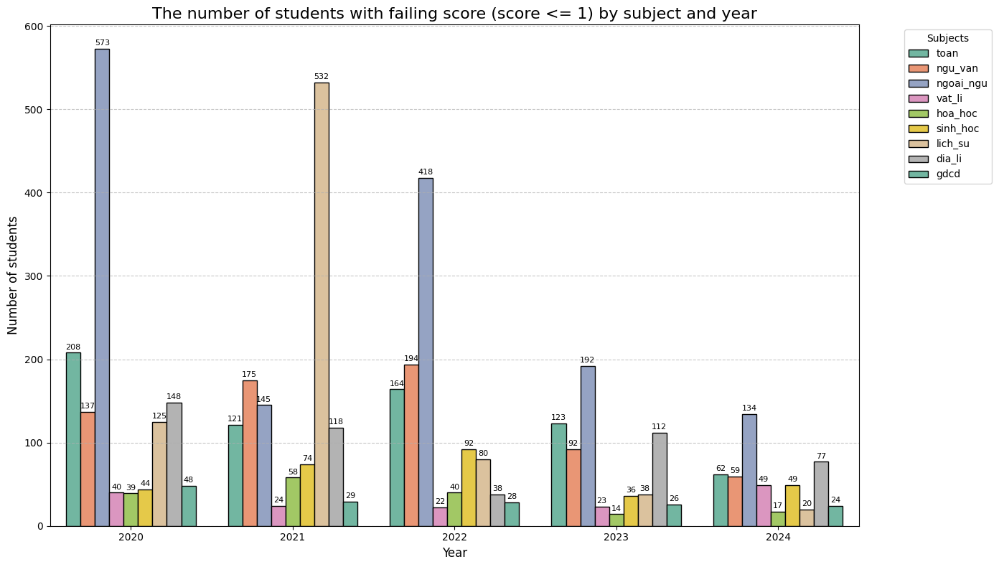

In [74]:
subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

liet_list = []

# Tính số học sinh bị điểm liệt cho từng môn và từng năm
for subject in subjects:
    liet = df_diem[df_diem[subject] <= 1].groupby(['year']).size()  # Số học sinh bị điểm liệt
    liet = liet.reset_index(name='so_hoc_sinh')
    liet['mon'] = subject  # Thêm cột môn học vào dataframe
    liet_list.append(liet)

# Gộp tất cả các môn lại thành 1 DataFrame
liet_df = pd.concat(liet_list)

# Barplot 
plt.figure(figsize=(14, 8))
ax = sns.barplot(data=liet_df, x='year', y='so_hoc_sinh', hue='mon', palette='Set2',edgecolor='black')

for container in ax.containers:
    ax.bar_label(container, fmt='%d', fontsize=8, padding=2)

# Chỉnh sửa tiêu đề, nhãn trục và thêm grid
plt.title('The number of students with failing score (score <= 1) by subject and year', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of students', fontsize=12)
plt.legend(title='Subjects', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)


plt.tight_layout()
plt.show()

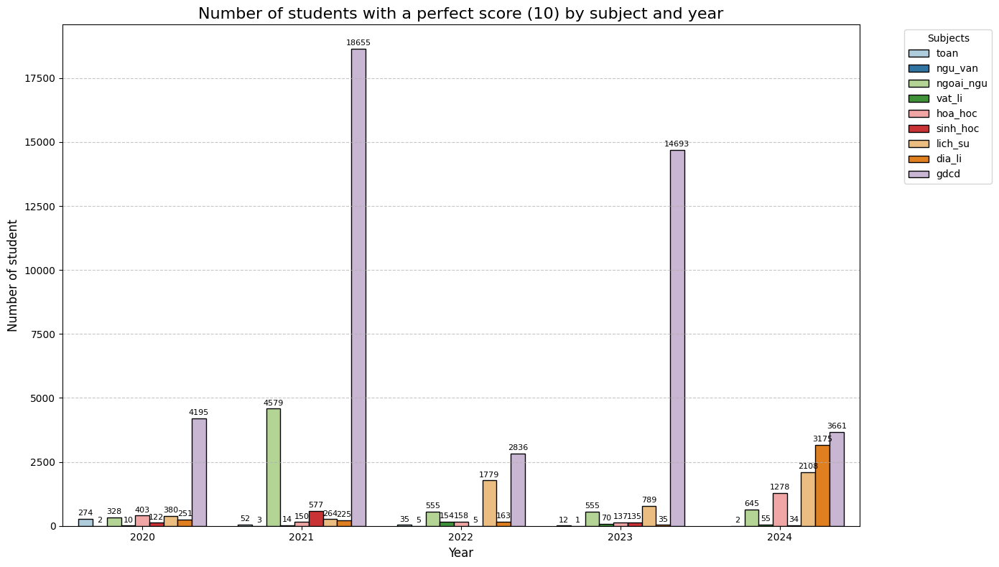

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

# Danh sách các môn học
subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

# Tạo một list để lưu kết quả
diem10_list = []

# Tính số học sinh đạt điểm 10 cho từng môn và từng năm
for subject in subjects:
    diem10 = df_diem[df_diem[subject] == 10].groupby('year').size()
    diem10 = diem10.reset_index(name='so_hoc_sinh')
    diem10['mon'] = subject
    diem10_list.append(diem10)

# Gộp tất cả các môn lại thành 1 DataFrame
diem10_df = pd.concat(diem10_list)

# Vẽ barplot với seaborn
plt.figure(figsize=(14, 8))
ax = sns.barplot(data=diem10_df, x='year', y='so_hoc_sinh', hue='mon', palette='Paired',edgecolor='black')

# Thêm số cụ thể lên từng cột
for container in ax.containers:
    ax.bar_label(container, fmt='%d', fontsize=8, padding=2)

# Chỉnh sửa tiêu đề, nhãn trục và thêm grid
plt.title('Number of students with a perfect score (10) by subject and year', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of student', fontsize=12)
plt.legend(title='Subjects', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()


## Correlation

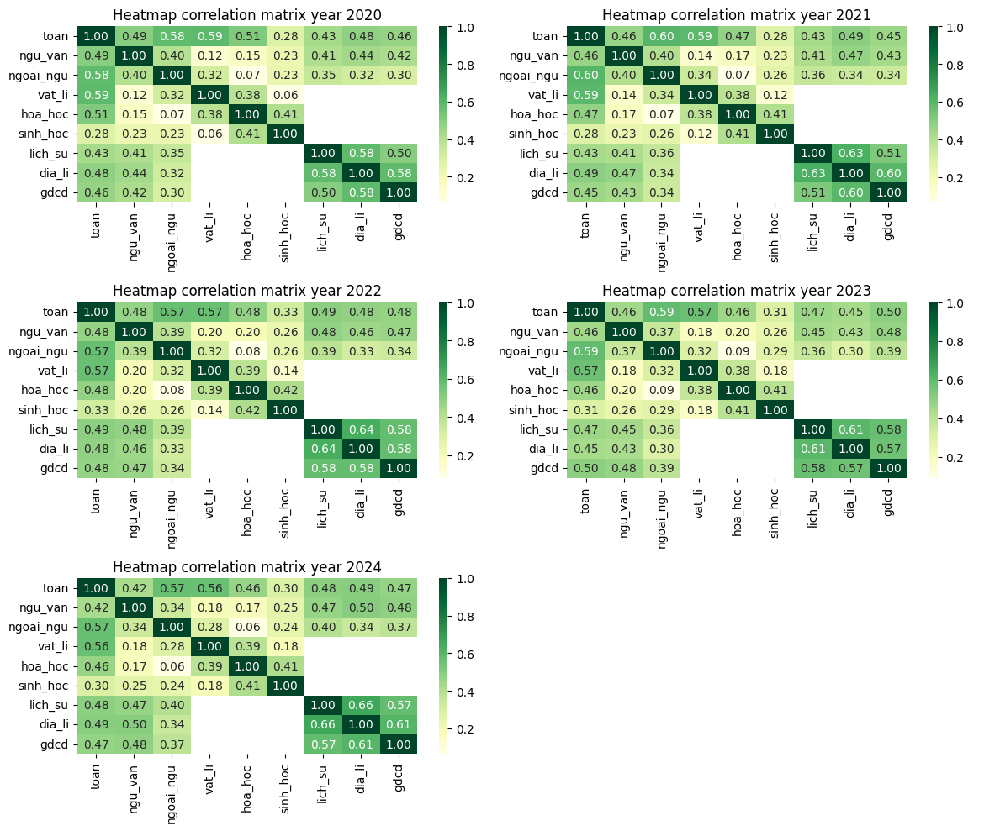

In [40]:
# Lọc dữ liệu cho năm 2020 đến 2024
years = [2020, 2021, 2022, 2023, 2024]
fig, axes = plt.subplots(3, 2, figsize=(12, 10))

# Lặp qua từng năm để vẽ heatmap cho mỗi năm
for i, year in enumerate(years):
    df_year = df_diem[df_diem['year'] == year]
    subject_scores = df_year[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
    
    corr_matrix = subject_scores.corr()
    
    # Chọn vị trí subplot thích hợp
    ax = axes[i // 2, i % 2]
    sns.heatmap(corr_matrix, annot=True, cmap='YlGn', fmt='.2f', ax=ax)
    ax.set_title(f'Heatmap correlation matrix year {year}')

axes[2,1].axis('off')
# Điều chỉnh layout để không bị chồng chéo
plt.tight_layout()
plt.show()


## 2024

In [76]:
diem_24

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,province
0,01000001,8.4,6.75,8.0,6.00,5.25,5.0,NaN,NaN,NaN,N1,2024,Hà Nội
1,01000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1,2024,Hà Nội
2,01000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1,2024,Hà Nội
3,01000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1,2024,Hà Nội
4,01000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1,2024,Hà Nội
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061600,64007282,4.2,6.00,3.0,NaN,NaN,NaN,5.25,6.25,7.50,N1,2024,Hậu Giang
1061601,64007283,5.2,6.00,3.6,NaN,NaN,NaN,6.25,5.75,7.75,N1,2024,Hậu Giang
1061602,64007284,7.2,8.00,7.0,6.25,7.00,8.0,NaN,NaN,NaN,N1,2024,Hậu Giang
1061603,64007285,5.2,5.25,4.4,NaN,NaN,NaN,4.75,6.50,8.75,N1,2024,Hậu Giang


### Toán

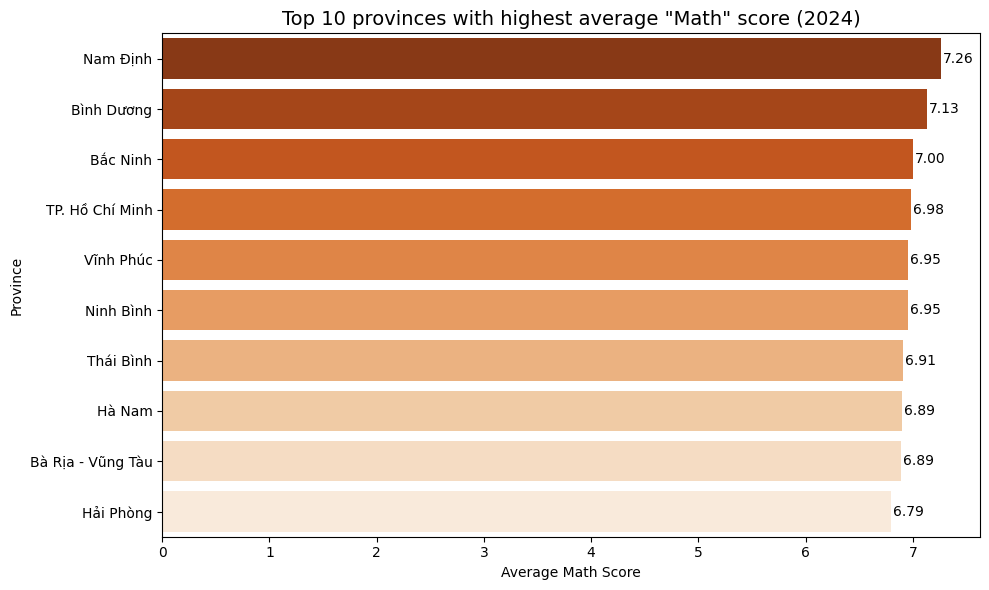

In [98]:
mean_scores = diem_24.groupby('province')['toan'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Math_Score']

colors = sns.color_palette("Oranges", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Math_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Math" score (2024)', fontsize=14)
plt.xlabel('Average Math Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Math_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [77]:
# Tính điểm Toán trung bình theo tỉnh
mean_scores = diem_24.groupby('province')['toan'].mean()

# Lọc top 10 tỉnh có điểm toán cao nhất
top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')


gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

# Tạo bản đồ Folium
m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

# Vẽ choropleth map
folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'toan'],
    key_on="feature.properties.name",  # Chắc chắn tên trong geojson là 'name'
    fill_color='YlOrRd',  # Bảng màu
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Điểm Toán Trung Bình',
    nan_fill_color='white',
).add_to(m)

# Thêm Tooltip chỉ hiển thị cho Top 10 tỉnh thành
for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        # Hiển thị Tooltip với tên tỉnh
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['toan']:.2f} điểm", 
        ).add_to(m)

m


### Ngữ Văn

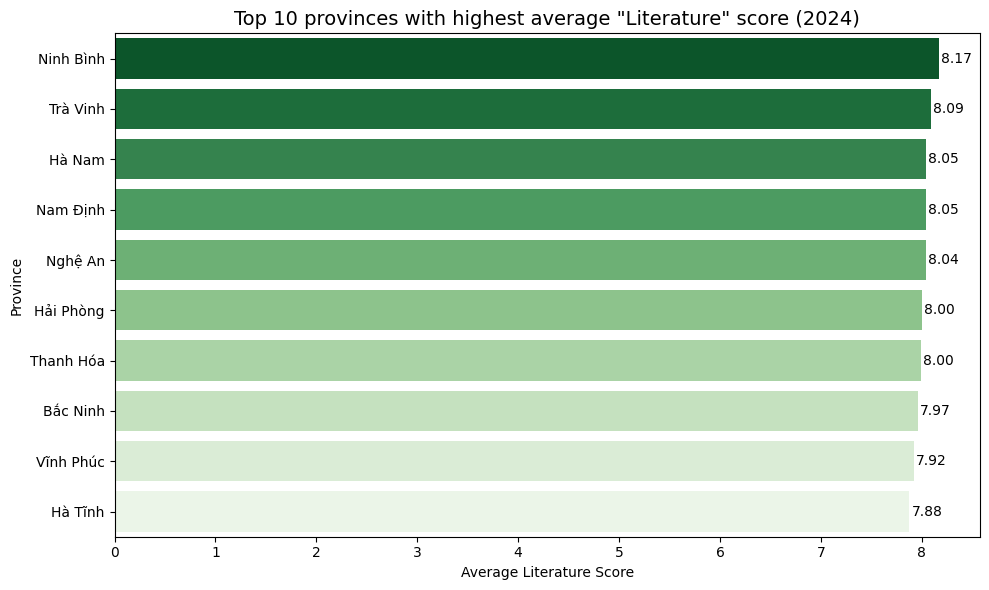

In [99]:
mean_scores = diem_24.groupby('province')['ngu_van'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Literature_Score']

colors = sns.color_palette("Greens", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Literature_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Literature" score (2024)', fontsize=14)
plt.xlabel('Average Literature Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Literature_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [ ]:
mean_scores = diem_24.groupby('province')['ngu_van'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'ngu_van'],
    key_on="feature.properties.name", 
    fill_color='YlGn',  
    line_opacity=0.2,
    legend_name='Điểm Văn Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['ngu_van']:.2f} điểm",  
        ).add_to(m)

m


### Ngoại Ngữ


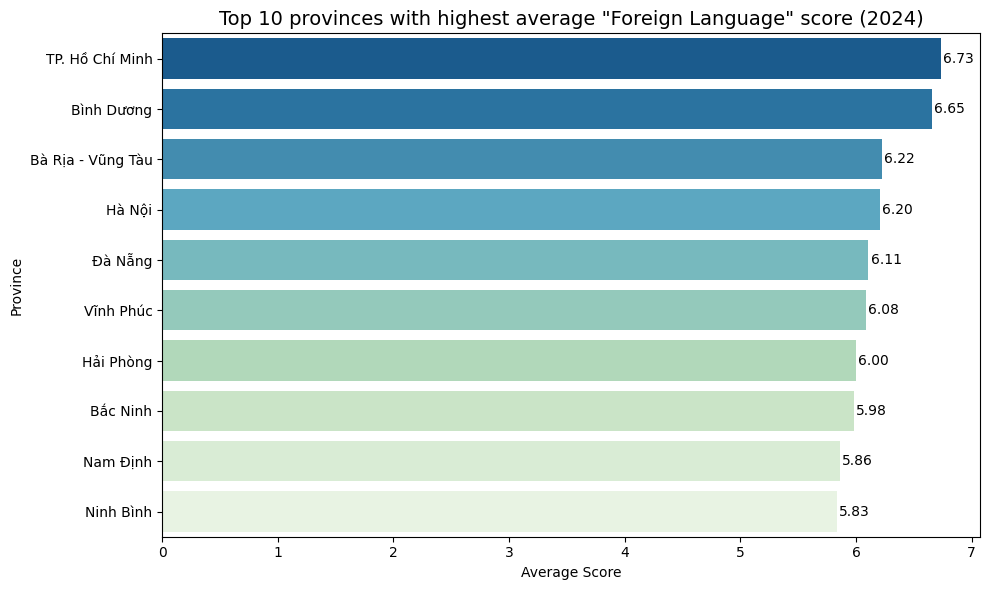

In [100]:
mean_scores = diem_24.groupby('province')['ngoai_ngu'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Foreign Language_Score']

colors = sns.color_palette("GnBu", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Foreign Language_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Foreign Language" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Foreign Language_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [367]:

mean_scores = diem_24.groupby('province')['ngoai_ngu'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'ngoai_ngu'],
    key_on="feature.properties.name", 
    fill_color='GnBu',  
    line_opacity=0.2,
    legend_name='Điểm Ngoại Ngữ Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['ngoai_ngu']:.2f} điểm",  
        ).add_to(m)

m


### Lí

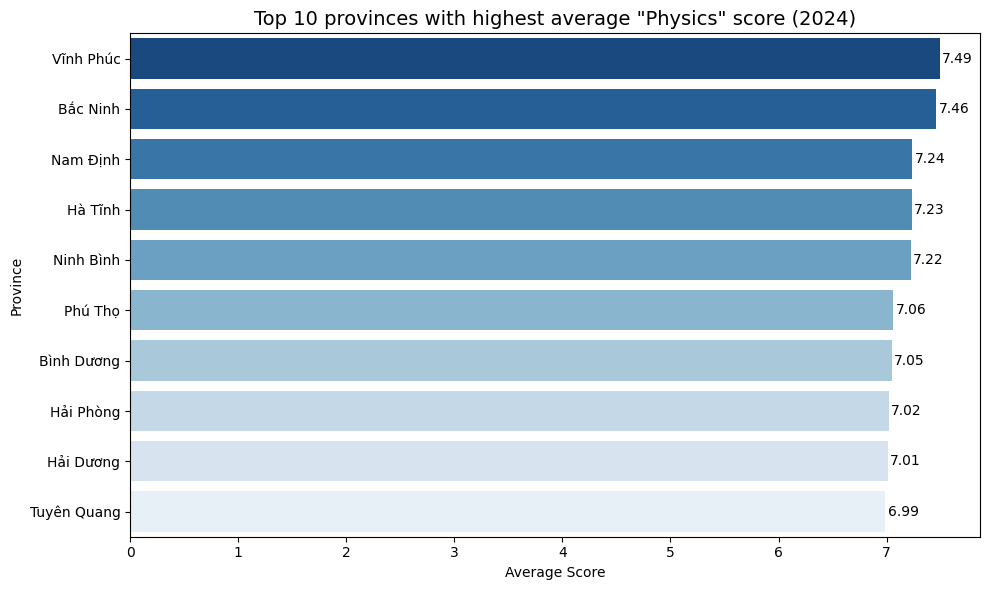

In [101]:
mean_scores = diem_24.groupby('province')['vat_li'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Physics_Score']

colors = sns.color_palette("Blues", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Physics_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Physics" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Physics_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [369]:

mean_scores = diem_24.groupby('province')['vat_li'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'vat_li'],
    key_on="feature.properties.name", 
    fill_color='PuBu',  
    line_opacity=0.2,
    legend_name='Điểm Lí Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['vat_li']:.2f} điểm",  
        ).add_to(m)
m


### Hóa

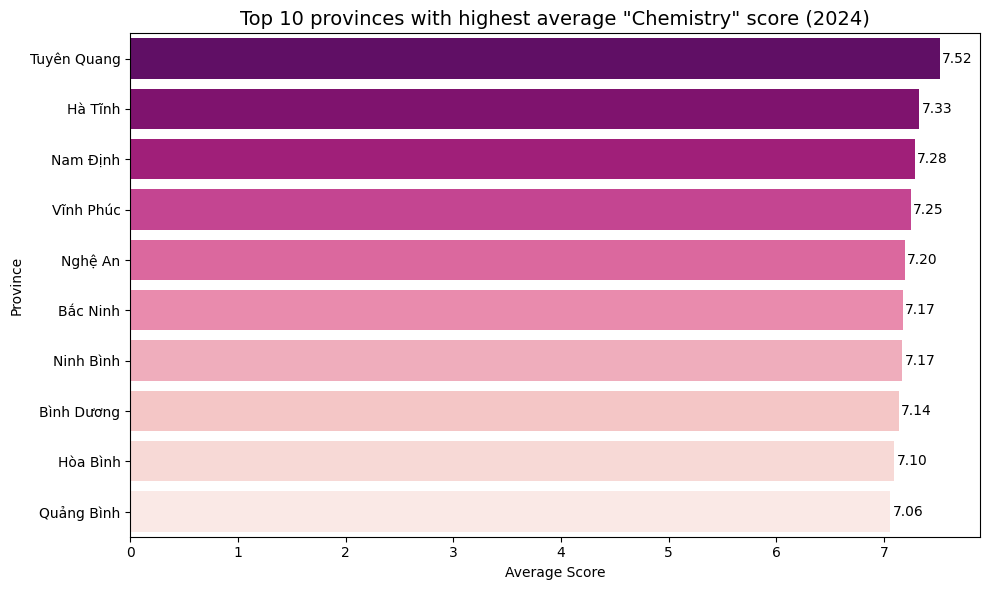

In [102]:
mean_scores = diem_24.groupby('province')['hoa_hoc'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Chemistry_Score']

colors = sns.color_palette("RdPu", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Chemistry_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Chemistry" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Chemistry_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [371]:
mean_scores = diem_24.groupby('province')['hoa_hoc'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'hoa_hoc'],
    key_on="feature.properties.name", 
    fill_color='RdPu',  
    line_opacity=0.2,
    legend_name='Điểm Hóa Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['hoa_hoc']:.2f} điểm",  
        ).add_to(m)
m

### Sinh

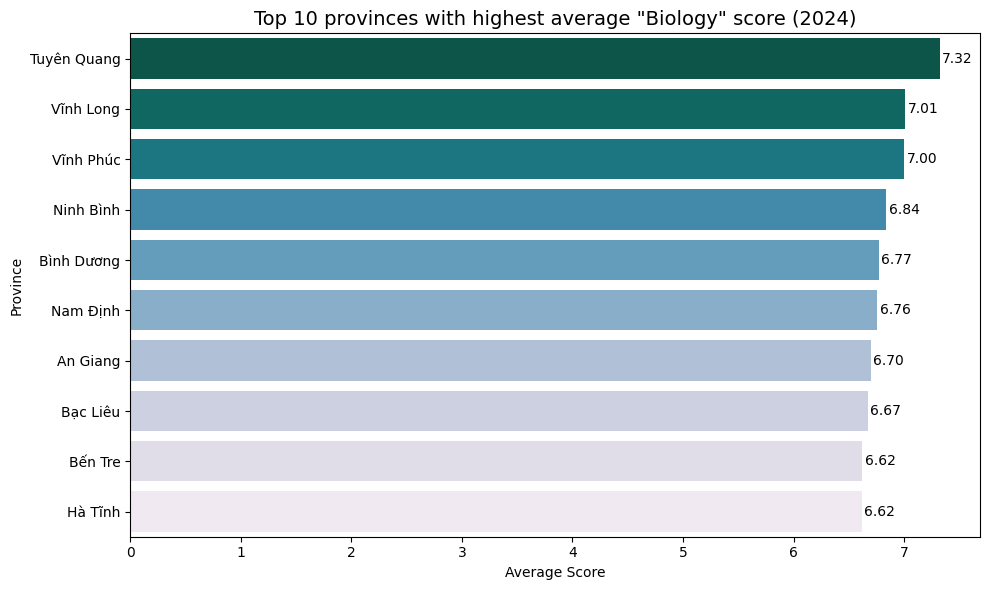

In [103]:
mean_scores = diem_24.groupby('province')['sinh_hoc'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Biology_Score']

colors = sns.color_palette("PuBuGn", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Biology_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Biology" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Biology_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [377]:
mean_scores = diem_24.groupby('province')['sinh_hoc'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'sinh_hoc'],
    key_on="feature.properties.name", 
    fill_color='PuBuGn',  
    line_opacity=0.2,
    legend_name='Điểm Sinh Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['sinh_hoc']:.2f} điểm",  
        ).add_to(m)
m

### Địa

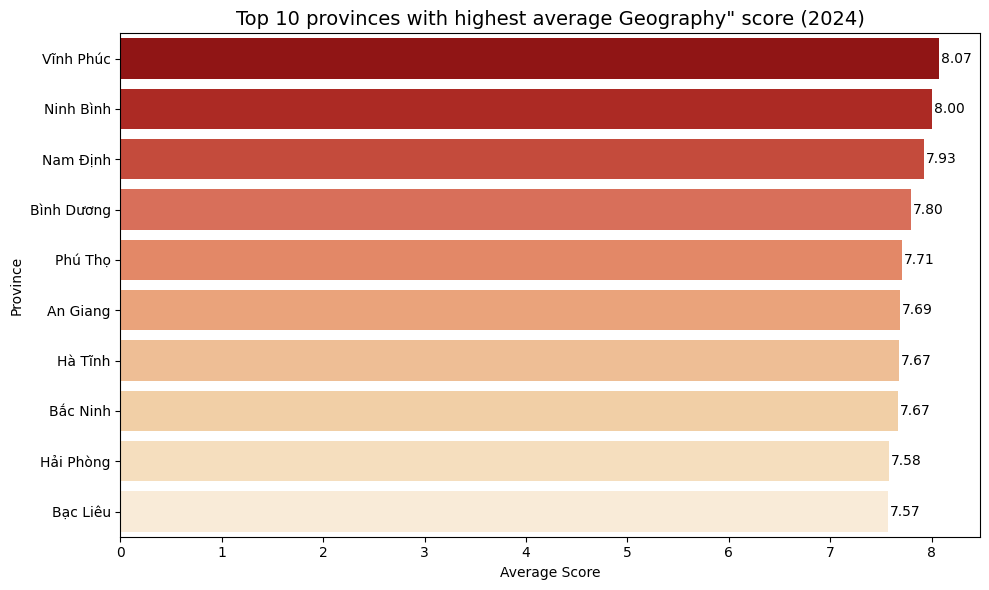

In [104]:
mean_scores = diem_24.groupby('province')['dia_li'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Geography_Score']

colors = sns.color_palette("OrRd", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Geography_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average Geography" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Geography_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [419]:
mean_scores = diem_24.groupby('province')['dia_li'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron', width='70%', height='100%')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'dia_li'],
    key_on="feature.properties.name", 
    fill_color='OrRd',  
    line_opacity=0.2,
    legend_name='Điểm Địa Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['dia_li']:.2f} điểm",  
        ).add_to(m)

m

### Sử

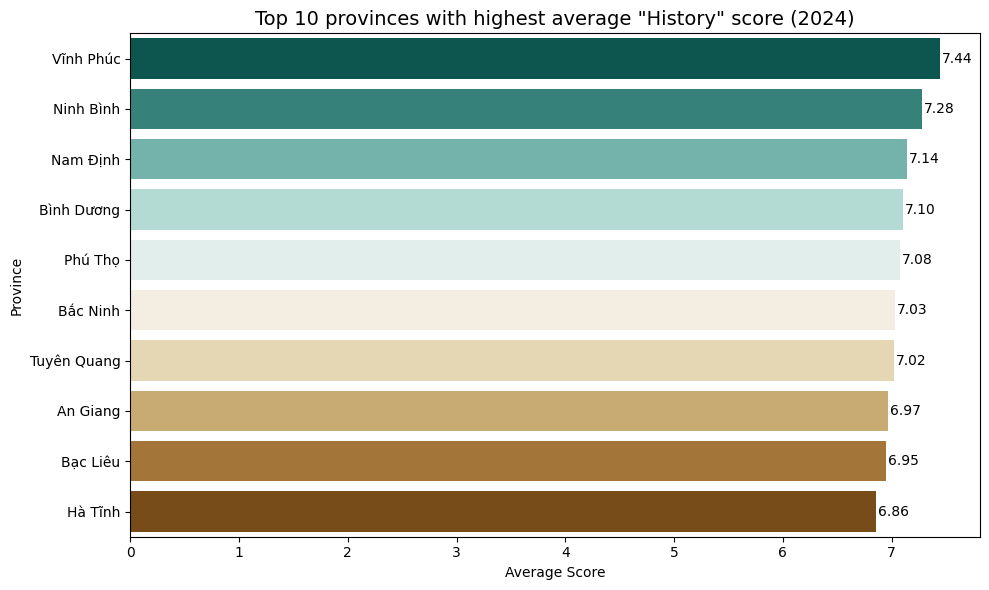

In [105]:
mean_scores = diem_24.groupby('province')['lich_su'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_History_Score']

colors = sns.color_palette("BrBG", n_colors=10)
colors.reverse()
plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_History_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "History" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_History_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [379]:
mean_scores = diem_24.groupby('province')['lich_su'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'lich_su'],
    key_on="feature.properties.name", 
    fill_color='BrBG',  
    line_opacity=0.2,
    legend_name='Điểm Sử Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['lich_su']:.2f} điểm",  
        ).add_to(m)
m

### GDCD

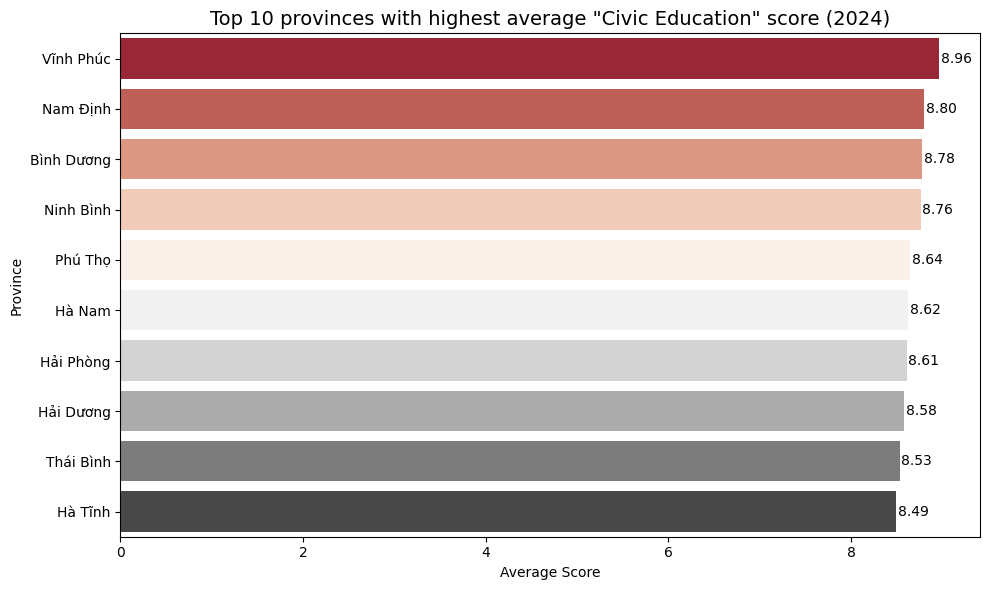

In [107]:
mean_scores = diem_24.groupby('province')['gdcd'].mean()
top10_provinces = mean_scores.nlargest(10)
top10_df = top10_provinces.reset_index()
top10_df.columns = ['Province', 'Average_Civic Education_Score']

colors = sns.color_palette("RdGy", n_colors=10)

plt.figure(figsize=(10, 6))
sns.barplot(data=top10_df, x='Average_Civic Education_Score', y='Province', palette=colors)


plt.title('Top 10 provinces with highest average "Civic Education" score (2024)', fontsize=14)
plt.xlabel('Average Score')
plt.ylabel('Province')

for index, value in enumerate(top10_df['Average_Civic Education_Score']):
    plt.text(value + 0.02, index, f'{value:.2f}', va='center')

plt.tight_layout()
plt.show()

In [436]:
mean_scores = diem_24.groupby('province')['gdcd'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'gdcd'],
    key_on="feature.properties.name", 
    fill_color='RdGy',  
    line_opacity=0.2,
    legend_name='Điểm GDCD Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['gdcd']:.2f} điểm",  
        ).add_to(m)
m

=> Vĩnh Phúc, Nam Định, Ninh Bình, and Bình Dương are among the most consistently high-performing provinces, appearing across multiple subjects such as Math, Physics, Chemistry, and Civic Education. TP. Hồ Chí Minh leads in Foreign Language, likely due to better language exposure and resources.
Some provinces show strong subject-specific performance, like Tuyên Quang in Biology and Chemistry, or Trà Vinh in Literature, indicating possible localized strengths or focus in teaching. Notably, provinces from both the North and the South appear in the top lists, suggesting that academic excellence is not limited to major urban centers alone


# 4. Prediction

In [ ]:
# Getting data
df_clean = df_diem[['toan', 'vat_li', 'ngoai_ngu']].dropna()
X = df_clean[['ngoai_ngu', 'vat_li']]
y = df_clean['toan']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluation
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.2f}')
print(f'R2 Score: {r2:.2f}')

MSE: 0.62
R2 Score: 0.35


In [58]:
# Actual vs Predicteđ
result_df = X_test.copy()
result_df['Actual Math'] = y_test.values
result_df['Predicted Math'] = y_pred

print(result_df.head(10))

         ngoai_ngu  vat_li  Actual Math  Predicted Math
1618712        5.6    5.50          8.4        7.277750
4753609        4.8    3.00          4.2        6.369168
890689         9.0    7.75          8.0        8.361626
1940690        3.0    8.25          7.2        7.931588
3012083        9.2    6.75          8.6        8.049835
3671487        5.4    6.25          7.2        7.506627
2318170        6.2    7.75          8.2        8.083556
2613400        8.0    6.75          7.4        7.930662
405301         7.6    3.25          7.4        6.730152
1601814        4.4    5.50          7.0        7.158577
